In [1]:
import sys
sys.path.append("..")
import numpy as np
import json
import matplotlib
import matplotlib.pyplot as plt
plt.ion()
%matplotlib widget
from cavsim2d.cavity import Cavity, Cavities, OperationPoints
import pprint
pp = pprint.PrettyPrinter(indent=4)

In [2]:
# load shape space
with open(r'D:/Dropbox/CavityDesignHub/MuCol_Study/Cavities/cavity_data_mid_end_cells.json') as f:
    shape_space = json.load(f)
pp.pprint(shape_space)

{   'C3795_1300MHz': {   'BP': 'both',
                         'FREQ': 1300,
                         'IC': [   38.36,
                                   40.78,
                                   18.63,
                                   14.25,
                                   44.4,
                                   57.6521,
                                   105.56,
                                   113.76249257990644],
                         'OC': [   38.59,
                                   35.48,
                                   10.61,
                                   7.4,
                                   49.33,
                                   57.83,
                                   105.56,
                                   107.9],
                         'OC_R': [   38.59,
                                     35.48,
                                     10.61,
                                     7.4,
                                     49.33,
                

# TESLA without CR beam

In [3]:
tesla_shape = shape_space['TESLA']
tesla = Cavity(9, tesla_shape, beampipe='both')

cavs = Cavities([])
# must first save cavities
cavs.save('D:\Dropbox\CavityDesignHub\MuCol_Study\SimulationData\ConsoleTest')

cavs.add_cavity(tesla, 'TESLA', 'TESLA')

Project D:\Dropbox\CavityDesignHub\MuCol_Study\SimulationData\ConsoleTest created successfully/already exists.


In [4]:
print(cavs)

{
    "TESLA": {
        "tune": {},
        "fm": {},
        "hom": {},
        "uq": {
            "tune": 0,
            "fm": null,
            "hom": null
        }
    }
}


In [5]:
c0 = 299792458
wakefield_config = {'rerun': True,
                    'polarisation': 0,
                    'beam_config': {
                        'bunch_length': 25,
                        'std_dev': 5,
                        'beam_offset': 0,
                        'nbunch': 1,
                        'separation': 20,
                    },
                    'wake_config': {
                        'wakelength': 50,
                        'counter_rotating': {'separation': c0/1.3e9},
                    },
                    # 'save_fields': {'nshot': 300}
                   # 'moving_mesh': True
                   }
cavs.run_wakefield(wakefield_config)

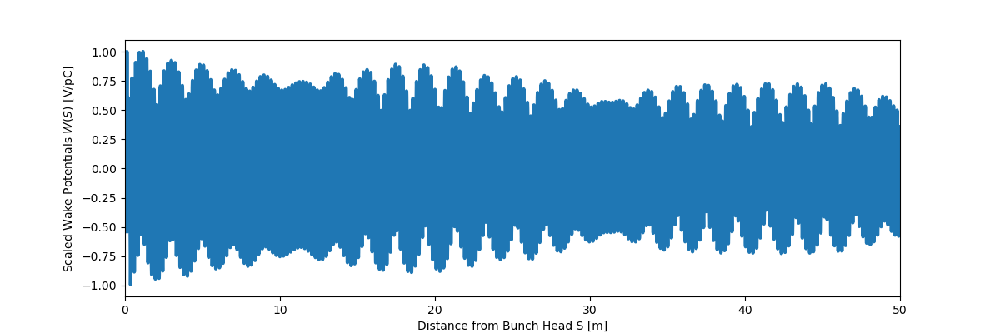

In [6]:
ax1 = cavs.plot('wpl')

In [7]:
cavs[0].plot_animate_wakefield()

C:\Users\sosoho\anaconda3\envs\cavsim2d\Lib\site-packages\matplotlib\animation.py:1741: UserWarning: Can not start iterating the frames for the initial draw. This can be caused by passing in a 0 length sequence for *frames*.

If you passed *frames* as a generator it may be exhausted due to a previous display or save.
  warnings.warn(


Once 
 
 Loop 
 
 Reflect

# TESLA with CR beam

In [8]:
tesla_shape = shape_space['TESLA']
tesla_cr = Cavity(9, tesla_shape, beampipe='both')

cavs = Cavities([])
# must first save cavities
cavs.save('D:\Dropbox\CavityDesignHub\MuCol_Study\SimulationData\ConsoleTest')

cavs.add_cavity(tesla_cr, 'TESLA_CR', 'TESLA_CR')
c0 = 299792458
wakefield_config = {'rerun': True,
                    'polarisation': 0,
                    'beam': {
                        'sigma': 25,
                        'std_devs': 5,
                        'beam_offset': 0,
                        'nbunches': 2,
                        'separation': 20,
                    },
                    'wake': {
                        'wakelength': 50,
                        'counter_rotating': {'opp_charge': True, 'separation': c0/1.3e9},
                    },
                    # 'save_fields': {'nshot': 300}
                   # 'moving_mesh': True
                   }
cavs.run_wakefield(wakefield_config)

Project D:\Dropbox\CavityDesignHub\MuCol_Study\SimulationData\ConsoleTest created successfully/already exists.


C:\Users\sosoho\anaconda3\envs\cavsim2d\Lib\site-packages\matplotlib\animation.py:892: UserWarning: Animation was deleted without rendering anything. This is most likely not intended. To prevent deletion, assign the Animation to a variable, e.g. `anim`, that exists until you output the Animation using `plt.show()` or `anim.save()`.
  warnings.warn(


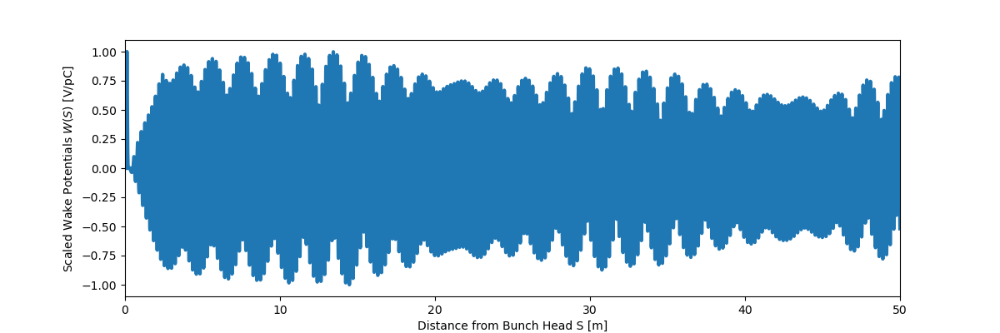

In [9]:
ax2 = cavs.plot('wpl')

# Comparison

In [10]:
tesla_shape = shape_space['TESLA']
tesla = Cavity(9, tesla_shape, beampipe='both')
tesla_cr = Cavity(9, tesla_shape, beampipe='both')

cavs = Cavities([])
# must first save cavities
cavs.save('D:\Dropbox\CavityDesignHub\MuCol_Study\SimulationData\ConsoleTest')

cavs.add_cavity([tesla, tesla_cr], ['TESLA', 'TESLA_CR'], ['TESLA', 'TESLA_CR'])
c0 = 299792458
wakefield_config = {'rerun': False,
                    'polarisation': 0,
                    'beam': {
                        'sigma': 25,
                        'std_devs': 5,
                        'beam_offset': 0,
                        'nbunches': 2,
                        'separation': 20,
                    },
                    'wake': {
                        'wakelength': 50,
                        'counter_rotating': {'opp_charge': True, 'separation': c0/1.3e9},
                    },
                    # 'save_fields': {'nshot': 300}
                   # 'moving_mesh': True
                   }
cavs.run_wakefield(wakefield_config)

Project D:\Dropbox\CavityDesignHub\MuCol_Study\SimulationData\ConsoleTest created successfully/already exists.


<Axes: xlabel='Distance from Bunch Head S [m]', ylabel='Scaled Wake Potentials $W (S)$ [V/pC]'>

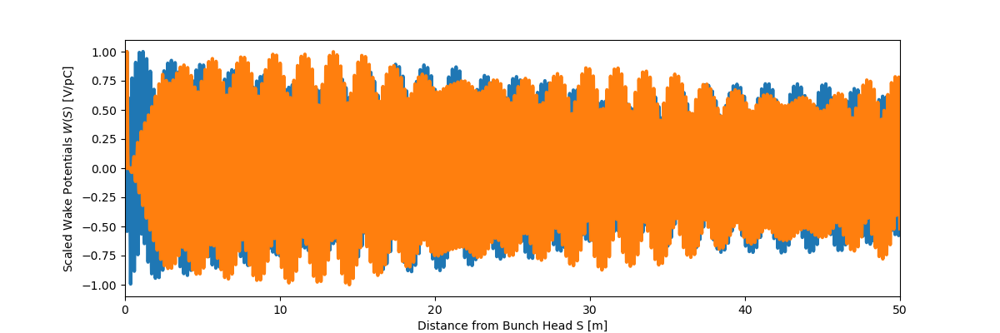

In [11]:
cavs.plot('wpl')

In [12]:
# cavs[0].plot_animate_wakefield()

# Tune with UQ

In [13]:
import sys
sys.path.append("..")
from cavsim2d.cavity import Cavity, Cavities, OperationPoints
import pprint as pp

cavs = Cavities()
cavs.save('D:\Dropbox\CavityDesignHub\MuCol_Study\SimulationData\ConsoleTest')

mid_cell = [42, 42, 12, 19, 35, 57.7, 103.3]
tesla = Cavity(9, mid_cell)
cavs.add_cavity(tesla, 'TESLA', 'TESLA')
# cavs.plot('geometry')

Project D:\Dropbox\CavityDesignHub\MuCol_Study\SimulationData\ConsoleTest created successfully/already exists.


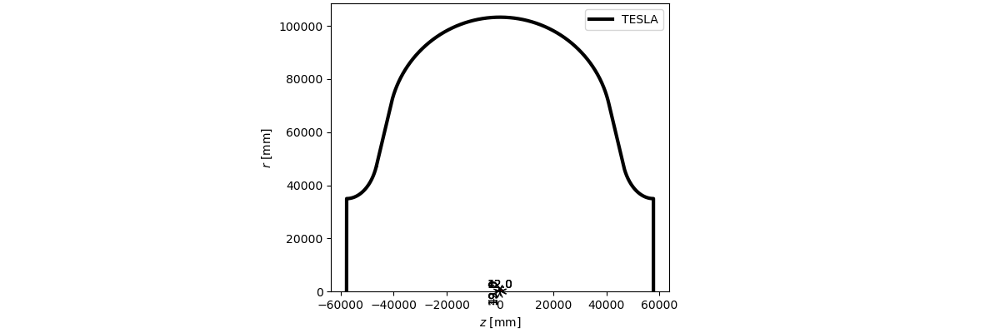

In [14]:
cavs.plot_cavities_contour_dimension()

In [15]:
tune_config = {'rerun': True,
              'freqs': [1300],
              'parameters': ['L']
              }
cavs.run_tune(tune_config)

"cell_types" not entered, defaulting to ['mid_cell']


In [16]:
pp.pprint(cavs.tune_results)

{'TESLA': {'CELL TYPE': 'mid_cell',
           'FREQ': 1299.9993521602062,
           'IC': [42.0,
                  42.0,
                  12.0,
                  19.0,
                  35.0,
                  60.806175223013724,
                  103.3,
                  109.34633547167627,
                  109.34633547167627],
           'OC': [42.0,
                  42.0,
                  12.0,
                  19.0,
                  35.0,
                  57.7,
                  103.3,
                  103.3087901515381,
                  103.3087901515381],
           'OC_R': [42.0,
                    42.0,
                    12.0,
                    19.0,
                    35.0,
                    57.7,
                    103.3,
                    103.3087901515381,
                    103.3087901515381],
           'TUNED VARIABLE': 'L'}}


{'conv': <Axes: label='conv', xlabel='Parameter', ylabel='Value'>,
 'abs_err': <Axes: label='abs_err', xlabel='Iteration', ylabel='Absolute error'>}

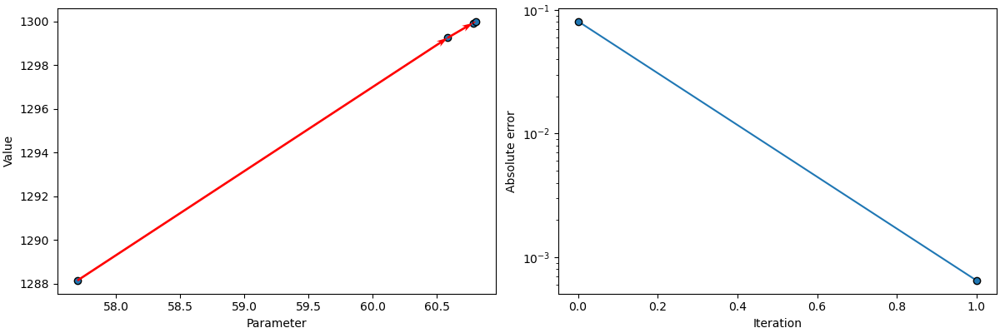

In [17]:
cavs.plot('convergence')

In [18]:
cavs[0].set_n_cells(9)
cavs.run_eigenmode()

In [19]:
pp.pprint(cavs.eigenmode_qois)

{'TESLA': {'Bpk [mT]': 8.625218837972615e-05,
           'Bpk/Eacc [mT/MV/m]': 7.5711592530809435,
           'Eacc [MV/m]': 1.139220368989431e-05,
           'Epk [MV/m]': 3.9095130514862506e-05,
           'Epk/Eacc []': 3.4317443384147572,
           'G [Ohm]': 299.02107914644904,
           'GR/Q [Ohm^2]': 202904.71091204142,
           'Hpk [A/m]': 0.06863731066563376,
           'N Cells': 9,
           'Normalization Length [mm]': 121.61235044602745,
           'Q []': 32088.65628481651,
           'R/Q [Ohm]': 678.5632353786888,
           'Req [mm]': 103.3,
           'Rsh [MOhm]': 21.774182427579785,
           'Vacc [MV]': 1.2468894007391581e-05,
           'ff [%]': -107.88912701470407,
           'freq [MHz]': 1310.9528416885628,
           'kcc [%]': 1.6578990589700235}}


In [20]:
# tune end cell
tune_config = {'rerun': True,
              'freqs': [1300],
              'parameters': ['L'],
               'cell_types': ['mid_end_cell']
              }
cavs.run_tune(tune_config)

In [21]:
pp.pprint(cavs.tune_results)

{'TESLA': {'CELL TYPE': 'mid_end_cell',
           'FREQ': 1299.9996837368762,
           'IC': [42.0,
                  42.0,
                  12.0,
                  19.0,
                  35.0,
                  60.806175223013724,
                  103.3,
                  109.34633547167627,
                  109.34633547167627],
           'OC': [42.0,
                  42.0,
                  12.0,
                  19.0,
                  35.0,
                  60.80636983680529,
                  103.3,
                  109.34666152265504,
                  109.34666152265504],
           'OC_R': [42.0,
                    42.0,
                    12.0,
                    19.0,
                    35.0,
                    60.80636983680529,
                    103.3,
                    109.34666152265504,
                    109.34666152265504],
           'TUNED VARIABLE': 'L'}}


In [22]:
cavs.run_eigenmode()

In [23]:
pp.pprint(cavs.eigenmode_qois)

{'TESLA': {'Bpk [mT]': 8.192218859174146e-05,
           'Bpk/Eacc [mT/MV/m]': 7.015593326296033,
           'Eacc [MV/m]': 1.1677157551974761e-05,
           'Epk [MV/m]': 3.726523496261281e-05,
           'Epk/Eacc []': 3.191293326029567,
           'G [Ohm]': 295.84483734898197,
           'GR/Q [Ohm^2]': 210897.3541745336,
           'Hpk [A/m]': 0.06519160631641065,
           'N Cells': 9,
           'Normalization Length [mm]': 121.61235044602745,
           'Q []': 31746.271687460045,
           'R/Q [Ohm]': 712.8647437770112,
           'Req [mm]': 103.3,
           'Rsh [MOhm]': 22.63079783235659,
           'Vacc [MV]': 1.2780779187818074e-05,
           'ff [%]': -137.03058322531857,
           'freq [MHz]': 1311.0795872038457,
           'kcc [%]': 1.6134570879331698}}


{'conv': <Axes: label='conv', xlabel='Parameter', ylabel='Value'>,
 'abs_err': <Axes: label='abs_err', xlabel='Iteration', ylabel='Absolute error'>}

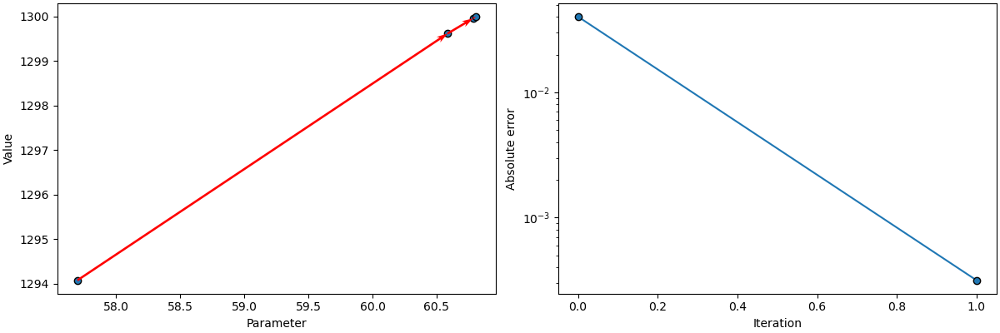

In [24]:
cavs.plot('convergence')

<Axes: xlabel='$z$ [mm]', ylabel='$r$ [mm]'>

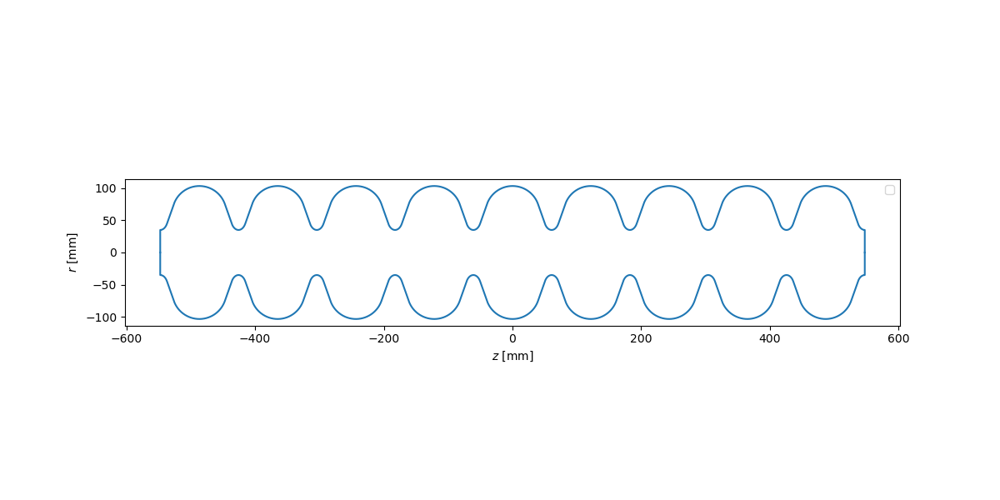

In [25]:
cavs.plot('geometry')

In [26]:
cavs[0].set_beampipe('both')

In [27]:
cavs.run_eigenmode()

In [28]:
pp.pprint(cavs.eigenmode_qois)

{'TESLA': {'Bpk [mT]': 8.192218858190841e-05,
           'Bpk/Eacc [mT/MV/m]': 7.01559297301135,
           'Eacc [MV/m]': 1.1677158138600564e-05,
           'Epk [MV/m]': 3.726520174391637e-05,
           'Epk/Eacc []': 3.191290320949818,
           'G [Ohm]': 295.84483734258754,
           'GR/Q [Ohm^2]': 210897.37535971965,
           'Hpk [A/m]': 0.06519160630858575,
           'N Cells': 9,
           'Normalization Length [mm]': 121.61235044602745,
           'Q []': 31746.27168677582,
           'R/Q [Ohm]': 712.864815401531,
           'Req [mm]': 103.3,
           'Rsh [MOhm]': 22.630800105680297,
           'Vacc [MV]': 1.2780779829886558e-05,
           'ff [%]': -121.23937079650537,
           'freq [MHz]': 1311.079587203685,
           'kcc [%]': 1.6134570879190588}}


In [29]:
cavs[0].plot_fields(9, 'E')

WebGuiWidget(layout=Layout(height='50vh', width='100%'), value={'gui_settings': {'Objects': {'Wireframe': Fals…

In [30]:
cavs.inspect()

AttributeError: 'Cavities' object has no attribute 'inspect'